In [60]:
# Clustering and Dimentionnality Reduction

<div class="alert alert-block alert-danger">

1. Import the CIFAR-10 dataset using the following code and create a new dataset containing only the following classes: "airplane," "automobile," "bird," and "cat."

<div/>

<div class="alert alert-block alert-warning">The CIFAR-10 dataset is composed of 60000 RGB images( 32x32 pixels), categorized into 10 classes with 6000 images per class. It is divided into 50000 training images and 10000 test images.
<div/>

In [61]:
from matplotlib import pyplot
from keras.datasets import cifar10
import numpy as np
# load dataset
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
label_names = ["airplane", "automobile", "bird", "cat", "deer", "dog", "frog", "horse", "ship", "truck"]
# summarize loaded dataset
print('Train: X=%s, y=%s' % (X_train.shape, y_train.shape))

Train: X=(50000, 32, 32, 3), y=(50000, 1)


In [62]:
import matplotlib.pyplot as plt

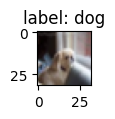

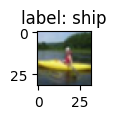

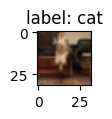

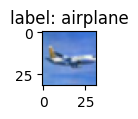

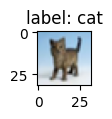

In [63]:
indexes = np.random.randint(0, len(X_train) + 1, 5)
for index in indexes:
    plt.figure(figsize=(0.7, 0.7))
    plt.imshow(X_train[index])
    plt.title(f'label: {label_names[int(y_train[index].item())]}')
    plt.show()

<div class="alert alert-block alert-danger">


2. Visualize some samples from the dataset with their corresponding labels.

3. Normalize the training data by dividing all values by 255.

4. Visualize the data using a 2D plot by applying dimensionality reduction based on PCA with two components.

5. Apply the K-means algorithm, K-means with PCA (with a variance of 95%), and K-means with LDA (3 components) on the normalized training data.

6. Visualize the data after clustering using a 2D plot (use PCA with 2 components for dimensionality reduction) for each model. What do you observe?

7. Compute the Davies-Bouldin score for all generated models.

8. Display the confusion matrix and the classification reports for all models. What do you observe?

9. Display some misclassifications for the best model (image with the true label and predicted label).

10. Try to enhance the performance of the best model.
<div/>

In [64]:
X_train = X_train / 255

In [65]:
X_train_ = X_train

In [66]:
X_train_ = X_train_.reshape(50000, -1)

In [67]:
from sklearn.decomposition import PCA

In [68]:
pca_ = PCA(n_components=2)

data_pca_ = pca_.fit_transform(X_train_)

In [69]:
import plotly.express as px

In [70]:
fig = px.scatter(
    x=data_pca_[:, 0], 
    y=data_pca_[:, 1], 
    color=y_train.flatten(),
    width=1080,
    height=720
    )

fig.show()

In [71]:
from sklearn.cluster import KMeans

# 1

In [72]:
kmeans = KMeans(n_clusters=10)
kmeans_ = kmeans.fit_transform(X_train_)

# 2

In [73]:
pca = PCA(n_components=0.95)

data_pca = pca.fit_transform(X_train_)
data_pca

array([[-6.40101763e+00,  2.72903876e+00,  1.50171052e+00, ...,
        -8.54011062e-03, -1.00279052e-01,  2.65642854e-01],
       [ 8.29783385e-01, -9.49943219e-01,  6.00375260e+00, ...,
        -3.97358773e-01,  3.52700156e-01,  3.58118873e-01],
       [ 7.73019978e+00, -1.15221023e+01, -2.75362051e+00, ...,
         1.88157365e-01,  1.80395760e-02, -3.09487116e-01],
       ...,
       [ 7.07346587e-01, -1.13425212e+01, -3.93914878e-01, ...,
         3.75771422e-03, -4.09139965e-01,  8.04638190e-02],
       [ 1.13679090e+01, -3.37597765e+00,  5.56619766e+00, ...,
        -8.31256970e-02, -5.38018849e-02, -1.98024607e-01],
       [ 4.19279645e+00, -1.18418848e+00, -4.44596297e+00, ...,
         2.70173472e-01, -6.05925262e-02,  7.50355893e-02]])

In [74]:
kmeans_with_pca = KMeans(n_clusters=10)
kmeans_with_pca.fit(data_pca)

KMeans(n_clusters=10)

# 3


In [75]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

In [76]:
lda = LDA(n_components=3)
data_lda = lda.fit_transform(X_train_, y_train)

C:\Users\user\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:1339: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [77]:
kmeans_with_lda = KMeans(n_clusters=10)
kmeans_with_lda.fit(data_lda)

KMeans(n_clusters=10)

In [78]:
fig = px.scatter(
    x=kmeans_[:, 0], 
    y=kmeans_[:, 1], 
    color=y_train.flatten(),
    width=1080,
    height=720
    )

fig.show()

In [79]:
data_kmeans_pca_ = kmeans_with_pca.fit_transform(data_pca_)
fig = px.scatter(
    x=data_kmeans_pca_[:, 0], 
    y=data_kmeans_pca_[:, 1], 
    color=y_train.flatten(),
    width=1080,
    height=720
    )

fig.show()

In [80]:
kmeans_with_lda = KMeans(n_clusters=10)
kmeans_with_lda.fit(data_lda)

data_kmeans_lda = kmeans_with_lda.fit_transform(data_lda)
fig = px.scatter(
    x=data_kmeans_lda[:, 0], 
    y=data_kmeans_lda[:, 1], 
    color=y_train.flatten(),
    width=1080,
    height=720
    )

fig.show()


In [81]:
from sklearn.metrics import davies_bouldin_score

In [82]:
kmeans_score = davies_bouldin_score(X_train_, y_train)
kmeans_pca_score = davies_bouldin_score(data_kmeans_pca_, y_train)
kmeans_lda_score = davies_bouldin_score(data_kmeans_lda, y_train)

print(f"kmeans: {kmeans_score:.2f}")
print(f"kmeans-pca: {kmeans_pca_score:.2f}")
print(f"kmeans-lda: {kmeans_lda_score:.2f}")

C:\Users\user\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:1339: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



kmeans: 12.00
kmeans-pca: 14.80
kmeans-lda: 8.09


C:\Users\user\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:1339: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\user\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:1339: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



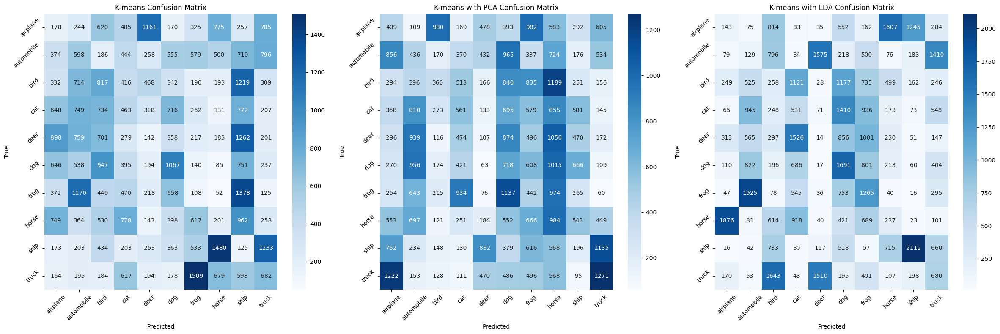


K-means Classification Report:
              precision    recall  f1-score   support

    airplane       0.04      0.04      0.04      5000
  automobile       0.11      0.12      0.11      5000
        bird       0.15      0.16      0.15      5000
         cat       0.10      0.09      0.10      5000
        deer       0.04      0.03      0.03      5000
         dog       0.22      0.21      0.22      5000
        frog       0.02      0.02      0.02      5000
       horse       0.05      0.04      0.04      5000
        ship       0.02      0.03      0.02      5000
       truck       0.14      0.14      0.14      5000

    accuracy                           0.09     50000
   macro avg       0.09      0.09      0.09     50000
weighted avg       0.09      0.09      0.09     50000


K-means with PCA Classification Report:
              precision    recall  f1-score   support

    airplane       0.08      0.08      0.08      5000
  automobile       0.08      0.09      0.08      5000
     

In [83]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report

def plot_confusion_matrices(y_true, kmeans_labels, kmeans_pca_labels, kmeans_lda_labels, label_names):
    y_true = y_true.flatten()
    
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 8))
    
    cm1 = confusion_matrix(y_true, kmeans_labels)
    sns.heatmap(cm1, annot=True, fmt='d', ax=ax1, cmap='Blues')
    ax1.set_title('K-means Confusion Matrix')
    ax1.set_xlabel('Predicted')
    ax1.set_ylabel('True')
    ax1.set_xticklabels(label_names, rotation=45)
    ax1.set_yticklabels(label_names, rotation=45)
    
    cm2 = confusion_matrix(y_true, kmeans_pca_labels)
    sns.heatmap(cm2, annot=True, fmt='d', ax=ax2, cmap='Blues')
    ax2.set_title('K-means with PCA Confusion Matrix')
    ax2.set_xlabel('Predicted')
    ax2.set_ylabel('True')
    ax2.set_xticklabels(label_names, rotation=45)
    ax2.set_yticklabels(label_names, rotation=45)
    
    cm3 = confusion_matrix(y_true, kmeans_lda_labels)
    sns.heatmap(cm3, annot=True, fmt='d', ax=ax3, cmap='Blues')
    ax3.set_title('K-means with LDA Confusion Matrix')
    ax3.set_xlabel('Predicted')
    ax3.set_ylabel('True')
    ax3.set_xticklabels(label_names, rotation=45)
    ax3.set_yticklabels(label_names, rotation=45)
    
    plt.tight_layout()
    plt.show()
    
    print("\nK-means Classification Report:")
    print(classification_report(y_true, kmeans_labels, target_names=label_names))
    
    print("\nK-means with PCA Classification Report:")
    print(classification_report(y_true, kmeans_pca_labels, target_names=label_names))
    
    print("\nK-means with LDA Classification Report:")
    print(classification_report(y_true, kmeans_lda_labels, target_names=label_names))

plot_confusion_matrices(
    y_train,
    kmeans.labels_, 
    kmeans_with_pca.labels_,  
    kmeans_with_lda.labels_,
    label_names
)

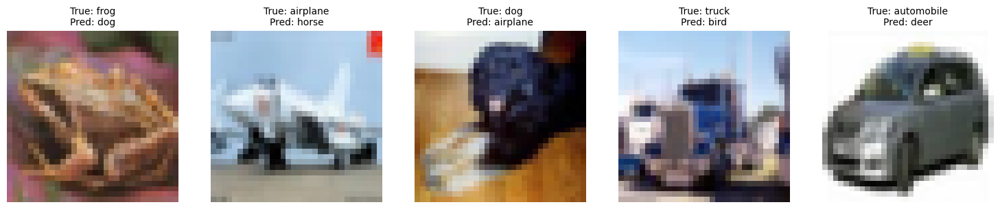

In [84]:
import matplotlib.pyplot as plt
import numpy as np

def display_misclassifications(X_train, y_true, y_pred, label_names, num_images=5):
    y_true = y_true.flatten()
    
    misclassified_idx = np.where(y_true != y_pred)[0]
    
    selected_idx = np.random.choice(misclassified_idx, size=min(num_images, len(misclassified_idx)), replace=False)
    
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
    
    for idx, ax in zip(selected_idx, axes):
        ax.imshow(X_train[idx])
        ax.axis('off')
        
        true_label = label_names[y_true[idx]]
        pred_label = label_names[y_pred[idx]]
        
        ax.set_title(f'True: {true_label}\nPred: {pred_label}', fontsize=10)
    
    plt.tight_layout()
    plt.show()

display_misclassifications(
    X_train,
    y_train,
    kmeans_with_lda.labels_,  
    label_names
)